In [1]:
%load_ext autoreload
%autoreload 2

# Prepare MEVA dataset

In [2]:
#!/bin/bash
!curl -L -o /content/meva-processed-2018-03-15-2.zip \
  https://www.kaggle.com/api/v1/datasets/download/zarus03/meva-processed-2018-03-15-2

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 9663M  100 9663M    0     0   102M      0  0:01:34  0:01:34 --:--:-- 92.2M


In [3]:
!mkdir -p data/meva && unzip -q /content/meva-processed-2018-03-15-2.zip -d data/meva

In [4]:
initial_csv_path = '/content/data/meva/annotations.csv'

In [5]:
import numpy as np
import pandas as pd

annot_df = pd.read_csv(initial_csv_path)
output_data = annot_df['video_path'].unique().astype(str) + ' 0 -1'
np.savetxt('/content/data/meva/annotations_pretrain.csv', output_data, fmt='%s')

In [6]:
len(output_data) // 16

8

In [7]:
pd.read_csv('/content/data/meva/annotations_pretrain.csv').iloc[0][0]

<ipython-input-7-dff5f499b2af>:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  pd.read_csv('/content/data/meva/annotations_pretrain.csv').iloc[0][0]


'2018-03-15/15/2018-03-15.15-45-00.15-50-00.bus.G508_frange2922-3130.avi 0 -1'

# Download kinetics test-set

In [ ]:
!gdown 11US3KptpqHsZ5K4wQLzs-OA3Y50OWtPJ

Downloading...
From: https://drive.google.com/uc?id=11US3KptpqHsZ5K4wQLzs-OA3Y50OWtPJ
To: /content/k400_list.zip
100% 3.26M/3.26M [00:00<00:00, 240MB/s]


In [ ]:
!unzip -o /content/k400_list.zip  -d k400_list

Archive:  /content/k400_list.zip
  inflating: k400_list/test.csv      
  inflating: k400_list/train.csv     
  inflating: k400_list/val.csv       


In [ ]:
#!/bin/bash
!curl -L -o /content/k4testset.zip \
    https://www.kaggle.com/api/v1/datasets/download/ipythonx/k4testset

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
  9 11.3G    9 1050M    0     0  19.9M      0  0:09:43  0:00:52  0:08:51 20.9M^C


In [ ]:
!unzip -q k4testset.zip

In [ ]:
!mv videos_val k400

In [ ]:
import pandas as pd
test = pd.read_csv('k400_list/test.csv', header=None)

In [ ]:
test.head()

,0
0,k400/jf7RDuUTrsQ.mp4 325
1,k400/JTlatknwOrY.mp4 233
2,k400/NUG7kwJ-614.mp4 103
3,k400/y9r115bgfNk.mp4 320
4,k400/ZnIDviwA8CE.mp4 244


In [ ]:
test[0] = test[0].str.replace(r'\d+$', '0 -1', regex=True)

In [ ]:
test

,0
0,k400/jf7RDuUTrsQ.mp4 0 -1
1,k400/JTlatknwOrY.mp4 0 -1
2,k400/NUG7kwJ-614.mp4 0 -1
3,k400/y9r115bgfNk.mp4 0 -1
4,k400/ZnIDviwA8CE.mp4 0 -1
...,...
19791,k400/AqM2x1-pBeA.mp4 0 -1
19792,k400/vYau9SZXn54.mp4 0 -1
19793,k400/we7YsEC0sfM.mp4 0 -1
19794,k400/8zht-OiqF3Q.mp4 0 -1


In [ ]:
test.to_csv('k400_list/test.csv', header=False, index=False)

# openxlab

In [ ]:
!pip install -q -U openxlab

In [ ]:
!openxlab login

openxlab: You can find your Access key & Secrete Key in your browser here: https://sso.openxlab.org.cn/usercenter?tab=secret
openxlab: Paste your Access Key here: rmv8a35e7gagbrp3bzrp
openxlab: Paste your Secrete Key here: 


In [ ]:
!openxlab dataset download \
    --dataset-repo OpenMMLab/Kinetics_700 \
    --source-path /raw/Kinetics_700.tar.gz.0001 \
    --target-path /content/data/kinetics

Fetching the list of files...

[1. file: Kinetics_700.tar.gz.0001 download info] File Progress: 3.15 % | Speed: 14.5 MB/s | Number of Workers: 8 | Time Elapsed: 271s | ETA: 6819.01sException ignored in atexit callback: <function shutdown at 0x7d2ff6a23b00>
Traceback (most recent call last):
  File "/usr/lib/python3.11/logging/__init__.py", line 2170, in shutdown
    def shutdown(handlerList=_handlerList):
    
  File "/usr/local/lib/python3.11/dist-packages/openxlab/dataset/io/downloader.py", line 296, in ctrl_c_handler
    sys.exit(1)
SystemExit: 1


# VideoMAE V2

In [8]:
!git clone https://github.com/OpenGVLab/VideoMAEv2.git

Cloning into 'VideoMAEv2'...
remote: Enumerating objects: 146, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (32/32), done.
remote: Total 146 (delta 20), reused 13 (delta 13), pack-reused 101 (from 1)
Receiving objects: 100% (146/146), 996.79 KiB | 25.56 MiB/s, done.
Resolving deltas: 100% (73/73), done.


In [13]:
# remove triton from requirements.txt
!pip install -q -r /content/VideoMAEv2/requirements.txt

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.9/89.9 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 4.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.3/216.3 kB 14.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 377.0/377.0 kB 23.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 35.3/35.3 MB 20.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.6/13.6 MB 56.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.6/8.6 MB 91.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 77.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.0/63.0 MB 9.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.1/13.1 MB 88.3 MB/s eta 0:00:00
   ━━━━━

In [ ]:
!pip install -q protobuf==3.20.*

In [16]:
!pip list | grep protobuf

protobuf                              3.20.3


In [ ]:
!pip3 install --pre torch torchvision torchaudio --index-url https://download.pytorch.org/whl/nightly/cu124

Looking in indexes: https://download.pytorch.org/whl/nightly/cu124
INFO: pip is looking at multiple versions of torch to determine which version is compatible with other requirements. This could take a while.
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.2/6.2 MB 86.4 MB/s eta 0:00:00
INFO: pip is looking at multiple versions of torchvision to determine which version is compatible with other requirements. This could take a while.
ERROR: Cannot install torch and torchvision==0.22.0.dev20250226+cu124 because these package versions have conflicting dependencies.

The conflict is caused by:
    The user requested torch
    torchvision 0.22.0.dev20250226+cu124 depends on torch==2.7.0.dev20250226

To fix this you could try to:
1. loosen the range of package versions you've specified
2. remove package versions to allow pip to attempt to solve the dependency conflict

ERROR: ResolutionImpossible: for help visit https://pip.pypa.io/en/latest/topics/dependency-resolution/#dealing-with-dependen

In [17]:
!pip install --pre -U triton==3.2.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.2/253.2 MB 4.4 MB/s eta 0:00:00
  Attempting uninstall: triton
    Found existing installation: triton 3.3.0
    Uninstalling triton-3.3.0:
      Successfully uninstalled triton-3.3.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torch 2.7.0 requires triton==3.3.0; platform_system == "Linux" and platform_machine == "x86_64", but you have triton 3.2.0 which is incompatible.
fastai 2.7.19 requires torch<2.7,>=1.10, but you have torch 2.7.0 which is incompatible.


In [18]:
!python -u /content/VideoMAEv2/run_mae_pretraining.py --help

usage: VideoMAE v2 pre-training script [--batch_size BATCH_SIZE]
                                       [--epochs EPOCHS]
                                       [--save_ckpt_freq SAVE_CKPT_FREQ]
                                       [--model MODEL]
                                       [--tubelet_size TUBELET_SIZE]
                                       [--with_checkpoint]
                                       [--decoder_depth DECODER_DEPTH]
                                       [--mask_type {random,tube}]
                                       [--decoder_mask_type {random,run_cell}]
                                       [--mask_ratio MASK_RATIO]
                                       [--decoder_mask_ratio DECODER_MASK_RATIO]
                                       [--input_size INPUT_SIZE]
                                       [--drop_path PCT]
                                       [--normlize_target NORMLIZE_TARGET]
                                       [--opt OPTIMIZER] [--op

In [20]:
import sys
def add_path(path):
    if path not in sys.path:
        sys.path.insert(0, path)

In [21]:
add_path('/content/VideoMAEv2')

In [22]:
from dataset import build_pretraining_dataset

In [38]:
from run_mae_pretraining import get_args, get_model

In [39]:
import argparse
parser = argparse.ArgumentParser(
        'VideoMAE v2 pre-training script', add_help=False)
parser.add_argument('--batch_size', default=64, type=int)
parser.add_argument('--epochs', default=300, type=int)
parser.add_argument('--save_ckpt_freq', default=50, type=int)

# Model parameters
parser.add_argument(
    '--model',
    default='pretrain_videomae_base_patch16_224',
    type=str,
    metavar='MODEL',
    help='Name of model to train')
parser.add_argument('--tubelet_size', type=int, default=2)
parser.add_argument(
    '--with_checkpoint', action='store_true', default=False)

parser.add_argument(
    '--decoder_depth', default=4, type=int, help='depth of decoder')

parser.add_argument(
    '--mask_type',
    default='tube',
    choices=['random', 'tube'],
    type=str,
    help='encoder masked strategy')
parser.add_argument(
    '--decoder_mask_type',
    default='run_cell',
    choices=['random', 'run_cell'],
    type=str,
    help='decoder masked strategy')

parser.add_argument(
    '--mask_ratio', default=0.9, type=float, help='mask ratio of encoder')
parser.add_argument(
    '--decoder_mask_ratio',
    default=0.0,
    type=float,
    help='mask ratio of decoder')

parser.add_argument(
    '--input_size',
    default=224,
    type=int,
    help='images input size for backbone')

parser.add_argument(
    '--drop_path',
    type=float,
    default=0.0,
    metavar='PCT',
    help='Drop path rate (default: 0.1)')

parser.add_argument(
    '--normlize_target',
    default=True,
    type=bool,
    help='normalized the target patch pixels')

# Optimizer parameters
parser.add_argument(
    '--opt',
    default='adamw',
    type=str,
    metavar='OPTIMIZER',
    help='Optimizer (default: "adamw"')
parser.add_argument(
    '--opt_eps',
    default=1e-8,
    type=float,
    metavar='EPSILON',
    help='Optimizer Epsilon (default: 1e-8)')
parser.add_argument(
    '--opt_betas',
    default=None,
    type=float,
    nargs='+',
    metavar='BETA',
    help='Optimizer Betas (default: None, use opt default)')
parser.add_argument(
    '--clip_grad',
    type=float,
    default=None,
    metavar='NORM',
    help='Clip gradient norm (default: None, no clipping)')
parser.add_argument(
    '--momentum',
    type=float,
    default=0.9,
    metavar='M',
    help='SGD momentum (default: 0.9)')
parser.add_argument(
    '--weight_decay',
    type=float,
    default=0.05,
    help='weight decay (default: 0.05)')
parser.add_argument(
    '--weight_decay_end',
    type=float,
    default=None,
    help="""Final value of the
    weight decay. We use a cosine schedule for WD.
    (Set the same value with args.weight_decay to keep weight decay no change)"""
)

parser.add_argument(
    '--lr',
    type=float,
    default=1.5e-4,
    metavar='LR',
    help='learning rate (default: 1.5e-4)')
parser.add_argument(
    '--warmup_lr',
    type=float,
    default=1e-6,
    metavar='LR',
    help='warmup learning rate (default: 1e-6)')
parser.add_argument(
    '--min_lr',
    type=float,
    default=1e-5,
    metavar='LR',
    help='lower lr bound for cyclic schedulers that hit 0 (1e-5)')

parser.add_argument(
    '--warmup_epochs',
    type=int,
    default=40,
    metavar='N',
    help='epochs to warmup LR, if scheduler supports')
parser.add_argument(
    '--warmup_steps',
    type=int,
    default=-1,
    metavar='N',
    help='epochs to warmup LR, if scheduler supports')

# Augmentation parameters
parser.add_argument(
    '--color_jitter',
    type=float,
    default=0.0,
    metavar='PCT',
    help='Color jitter factor (default: 0.4)')
parser.add_argument(
    '--train_interpolation',
    type=str,
    default='bicubic',
    choices=['random', 'bilinear', 'bicubic'],
    help='Training interpolation')

# * Finetuning params
parser.add_argument(
    '--finetune', default='', help='finetune from checkpoint')

# Dataset parameters
parser.add_argument(
    '--data_path',
    default='/your/data/annotation/path',
    type=str,
    help='dataset path')
parser.add_argument(
    '--data_root', default='', type=str, help='dataset path root')
parser.add_argument(
    '--fname_tmpl',
    default='img_{:05}.jpg',
    type=str,
    help='filename_tmpl for rawframe data')
parser.add_argument(
    '--imagenet_default_mean_and_std', default=True, action='store_true')
parser.add_argument('--num_frames', type=int, default=16)
parser.add_argument('--sampling_rate', type=int, default=4)
parser.add_argument('--num_sample', type=int, default=1)
parser.add_argument(
    '--output_dir',
    default='',
    help='path where to save, empty for no saving')
parser.add_argument(
    '--log_dir', default=None, help='path where to tensorboard log')
parser.add_argument(
    '--device',
    default='cuda',
    help='device to use for training / testing')
parser.add_argument('--seed', default=0, type=int)
parser.add_argument('--resume', default='', help='resume from checkpoint')
parser.add_argument('--auto_resume', action='store_true')
parser.add_argument(
    '--no_auto_resume', action='store_false', dest='auto_resume')
parser.set_defaults(auto_resume=True)

parser.add_argument(
    '--start_epoch', default=0, type=int, metavar='N', help='start epoch')
parser.add_argument('--num_workers', default=10, type=int)
parser.add_argument(
    '--pin_mem',
    action='store_true',
    help=
    'Pin CPU memory in DataLoader for more efficient (sometimes) transfer to GPU.'
)
parser.add_argument(
    '--no_pin_mem', action='store_false', dest='pin_mem', help='')
parser.set_defaults(pin_mem=True)

# distributed training parameters
parser.add_argument(
    '--world_size',
    default=1,
    type=int,
    help='number of distributed processes')
parser.add_argument('--local_rank', default=-1, type=int)
parser.add_argument('--dist_on_itp', action='store_true')
parser.add_argument(
    '--dist_url',
    default='env://',
    help='url used to set up distributed training')
args = parser.parse_args(['--batch_size', '16',
                          '--data_path', '/content/data/meva/annotations_pretrain.csv',
                          '--data_root', '/content/data/meva',
                          '--num_workers', '2'])
args

Namespace(batch_size=16, epochs=300, save_ckpt_freq=50, model='pretrain_videomae_base_patch16_224', tubelet_size=2, with_checkpoint=False, decoder_depth=4, mask_type='tube', decoder_mask_type='run_cell', mask_ratio=0.9, decoder_mask_ratio=0.0, input_size=224, drop_path=0.0, normlize_target=True, opt='adamw', opt_eps=1e-08, opt_betas=None, clip_grad=None, momentum=0.9, weight_decay=0.05, weight_decay_end=None, lr=0.00015, warmup_lr=1e-06, min_lr=1e-05, warmup_epochs=40, warmup_steps=-1, color_jitter=0.0, train_interpolation='bicubic', finetune='', data_path='/content/data/meva/annotations_pretrain.csv', data_root='/content/data/meva', fname_tmpl='img_{:05}.jpg', imagenet_default_mean_and_std=True, num_frames=16, sampling_rate=4, num_sample=1, output_dir='', log_dir=None, device='cuda', seed=0, resume='', auto_resume=True, start_epoch=0, num_workers=2, pin_mem=True, world_size=1, local_rank=-1, dist_on_itp=False, dist_url='env://')

In [40]:
model = get_model(args)
patch_size = model.encoder.patch_embed.patch_size
print("Patch size = %s" % str(patch_size))
args.window_size = (args.num_frames // args.tubelet_size,
                    args.input_size // patch_size[0],
                    args.input_size // patch_size[1])
args.patch_size = patch_size
args

Creating model: pretrain_videomae_base_patch16_224
Patch size = (16, 16)


Namespace(batch_size=16, epochs=300, save_ckpt_freq=50, model='pretrain_videomae_base_patch16_224', tubelet_size=2, with_checkpoint=False, decoder_depth=4, mask_type='tube', decoder_mask_type='run_cell', mask_ratio=0.9, decoder_mask_ratio=0.0, input_size=224, drop_path=0.0, normlize_target=True, opt='adamw', opt_eps=1e-08, opt_betas=None, clip_grad=None, momentum=0.9, weight_decay=0.05, weight_decay_end=None, lr=0.00015, warmup_lr=1e-06, min_lr=1e-05, warmup_epochs=40, warmup_steps=-1, color_jitter=0.0, train_interpolation='bicubic', finetune='', data_path='/content/data/meva/annotations_pretrain.csv', data_root='/content/data/meva', fname_tmpl='img_{:05}.jpg', imagenet_default_mean_and_std=True, num_frames=16, sampling_rate=4, num_sample=1, output_dir='', log_dir=None, device='cuda', seed=0, resume='', auto_resume=True, start_epoch=0, num_workers=2, pin_mem=True, world_size=1, local_rank=-1, dist_on_itp=False, dist_url='env://', window_size=(8, 14, 14), patch_size=(16, 16))

In [60]:
dataset = build_pretraining_dataset(args)

Data Aug = (DataAugmentationForVideoMAEv2,
  transform = Compose(
),
  Encoder Masking Generator = Tube Masking: total patches 1568, mask patches 1408,
  Do not use decoder masking,
)


In [90]:
d = dataset[0]

In [91]:
d[0].shape

torch.Size([3, 16, 224, 224])

In [ ]:
!pip install -q --upgrade --force-reinstall matplotlib

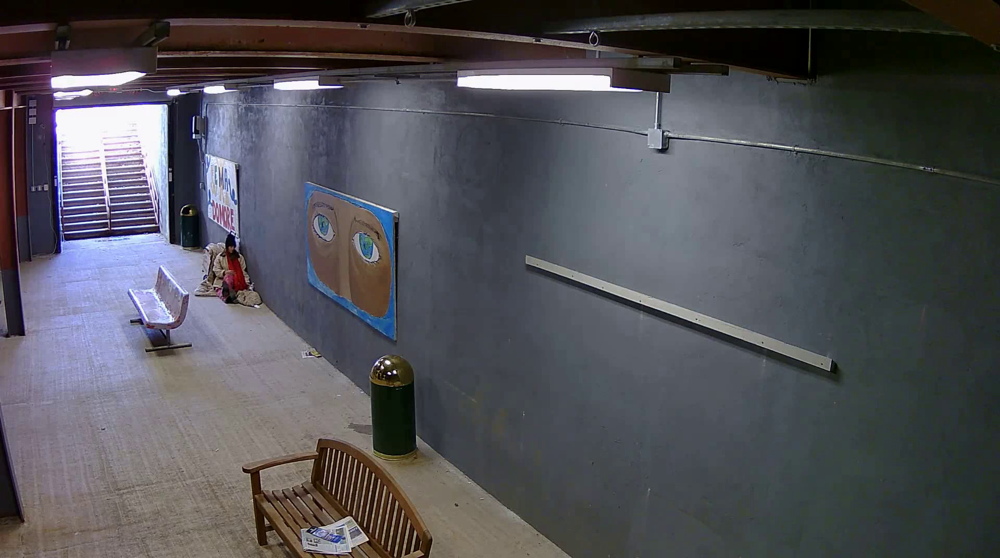

In [98]:
from PIL import Image
import imageio

filename = 'data/meva/2018-03-15/16/2018-03-15.15-55-00.16-00-00.bus.G508_frange466-548.avi'
vid = imageio.get_reader(filename, 'ffmpeg')
num=10
image = vid.get_data(num)
pil_image = Image.fromarray(image)
display(pil_image)

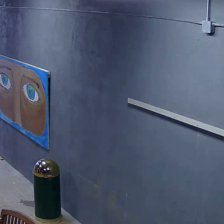

In [94]:
import torch
from PIL import Image
import numpy as np

# Assuming your tensor is named 'video_tensor' with shape [3, 16, 224, 224]
# Example tensor (replace with yours):
video_tensor = d[0].clone().detach()  # Random tensor with values 0-1

# Get first frame (shape will be [3, 224, 224])
first_frame = video_tensor[:, 1, :, :]

# Convert to numpy and permute channels to HWC format [224, 224, 3]
frame_np = first_frame.permute(1, 2, 0).numpy()

frame_np = (frame_np - np.min(frame_np)) / (np.max(frame_np) - np.min(frame_np))

# Convert to 0-255 range and uint8 type
frame_np = (frame_np * 255).astype(np.uint8)

# Create PIL Image
pil_image = Image.fromarray(frame_np)

# Display the image (works in Jupyter/IPython)
display(pil_image)  # For Jupyter Notebook/Lab

# OR save to file
pil_image.save('first_frame.jpg')

In [ ]:
x !wget https://huggingface.co/OpenGVLab/VideoMAE2/resolve/main/distill/vit_b_k710_dl_from_giant.pth

--2025-05-19 18:54:53--  https://huggingface.co/OpenGVLab/VideoMAE2/resolve/main/distill/vit_b_k710_dl_from_giant.pth
Resolving huggingface.co (huggingface.co)... 3.165.160.61, 3.165.160.12, 3.165.160.59, ...
Connecting to huggingface.co (huggingface.co)|3.165.160.61|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://cdn-lfs-us-1.hf.co/repos/30/fa/30fa9ef7e6a7cb70be94a7eb1e5e244f3e43d4844e147c41fc5965a78822fe01/8141a6955e0700d11bf15928fe6d61e5cfe482606fed8cfdddb1b922c0fd88ec?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27vit_b_k710_dl_from_giant.pth%3B+filename%3D%22vit_b_k710_dl_from_giant.pth%22%3B&Expires=1747684493&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTc0NzY4NDQ5M319LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy11cy0xLmhmLmNvL3JlcG9zLzMwL2ZhLzMwZmE5ZWY3ZTZhN2NiNzBiZTk0YTdlYjFlNWUyNDRmM2U0M2Q0ODQ0ZTE0N2M0MWZjNTk2NWE3ODgyMmZlMDEvODE0MWE2OTU1ZTA3MDBkMTFiZjE1OTI4ZmU2ZDYxZTVjZmU0ODI2MDZmZWQ4Y2Z

In [ ]:
system_root = '/content'
seed = 0
exp_name = 'pretrained_videomae_meva_15'

In [ ]:
import os
from datetime import datetime

current_time = datetime.now().strftime("%d.%m.%Y_%H-%M")
run_name = f"{exp_name}__{seed}__{current_time}"

log_dir = f"{system_root}/runs/{run_name}"
output_dir = f"{system_root}/results/{run_name}"

os.environ['LOGGING_DIR'] = log_dir
os.environ['OUTPUT_DIR'] = output_dir

In [5]:
%reload_ext tensorboard
%tensorboard --logdir=/content/runs

<IPython.core.display.Javascript object>

In [ ]:
!python -u /content/VideoMAEv2/run_mae_pretraining.py \
    --batch_size=16 \
    --epochs=300 \
    --save_ckpt_freq=10 \
    --model=pretrain_videomae_base_patch16_224 \
    --finetune=/content/vit_b_k710_dl_from_giant.pth \
    --data_path=/content/data/meva/annotations_pretrain.csv \
    --data_root=/content/data/meva \
    --num_workers=2 \
    --output_dir=$OUTPUT_DIR \
    --log_dir=$LOGGING_DIR \
    --seed=0

Not using distributed mode
Namespace(batch_size=16, epochs=300, save_ckpt_freq=10, model='pretrain_videomae_base_patch16_224', tubelet_size=2, with_checkpoint=False, decoder_depth=4, mask_type='tube', decoder_mask_type='run_cell', mask_ratio=0.9, decoder_mask_ratio=0.0, input_size=224, drop_path=0.0, normlize_target=True, opt='adamw', opt_eps=1e-08, opt_betas=None, clip_grad=None, momentum=0.9, weight_decay=0.05, weight_decay_end=None, lr=0.00015, warmup_lr=1e-06, min_lr=1e-05, warmup_epochs=40, warmup_steps=-1, color_jitter=0.0, train_interpolation='bicubic', finetune='/content/vit_b_k710_dl_from_giant.pth', data_path='/content/data/meva/annotations_pretrain.csv', data_root='/content/data/meva', fname_tmpl='img_{:05}.jpg', imagenet_default_mean_and_std=True, num_frames=16, sampling_rate=4, num_sample=1, output_dir='/content/results/pretrained_videomae_meva_15__0__19.05.2025_18-54', log_dir='/content/runs/pretrained_videomae_meva_15__0__19.05.2025_18-54', device='cuda', seed=0, resume=

In [ ]:
!zip -r pretrained_videomae_meva_15_20_05_2025_0_11.zip runs results

  adding: runs/ (stored 0%)
  adding: runs/pretrained_videomae_meva_15__0__19.05.2025_18-54/ (stored 0%)
  adding: runs/pretrained_videomae_meva_15__0__19.05.2025_18-54/events.out.tfevents.1747680956.736cb8e18e5b (deflated 71%)
  adding: results/ (stored 0%)
  adding: results/pretrained_videomae_meva_15__0__19.05.2025_18-54/ (stored 0%)
  adding: results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoint-29.pth (deflated 7%)
  adding: results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoint-49.pth (deflated 7%)
  adding: results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoint-59.pth (deflated 7%)
  adding: results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoint-19.pth (deflated 7%)
  adding: results/pretrained_videomae_meva_15__0__19.05.2025_18-54/log.txt (deflated 84%)
  adding: results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoint-39.pth (deflated 7%)
  adding: results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoin

In [ ]:
os.path.getsize('/content/pretrained_videomae_meva_15_20_05_2025_0_11.zip') // 1024 ** 3

5

In [ ]:
from google.colab import files
files.download('/content/results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoint-49.pth')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files
files.download('/content/pretrained_videomae_meva_15_20_05_2025_0_11.zip')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [103]:
#!/bin/bash
# Export your Kaggle username and API key
# export KAGGLE_USERNAME=<YOUR USERNAME>
# export KAGGLE_KEY=<YOUR KAGGLE KEY>
from google.colab import userdata

!curl -L -u {userdata.get('KAGGLE_USERNAME')}:{userdata.get('KAGGLE_KEY')}\
  -o /content/model.tar.gz\
  https://www.kaggle.com/api/v1/models/zarus03/videomae_pretrain_15_1/pyTorch/default/1/download

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100 6000M  100 6000M    0     0  71.4M      0  0:01:23  0:01:23 --:--:-- 60.8M


In [104]:
!tar -xvzf /content/model.tar.gz

results/pretrained_videomae_meva_15__0__19.05.2025_18-54/
results/
results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoint-19.pth
results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoint-29.pth
results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoint-39.pth
results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoint-49.pth
results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoint-59.pth
results/pretrained_videomae_meva_15__0__19.05.2025_18-54/checkpoint-9.pth
results/pretrained_videomae_meva_15__0__19.05.2025_18-54/log.txt
runs/pretrained_videomae_meva_15__0__19.05.2025_18-54/
runs/
runs/pretrained_videomae_meva_15__0__19.05.2025_18-54/events.out.tfevents.1747680956.736cb8e18e5b


In [3]:
#!/bin/bash
!curl -L -o /content/model.tar.gz \
  https://www.kaggle.com/api/v1/models/zarus03/yolovideomae_pretrained_15_localization_finetuning/pyTorch/default/1/download

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
  0     0    0     0    0     0      0      0 --:--:-- --:--:-- --:--:--     0
100  657M  100  657M    0     0  92.0M      0  0:00:07  0:00:07 --:--:--  106M


In [4]:
!tar -xvzf /content/model.tar.gz

results/
results/0.png
results/1.png
results/2.png
results/3.png
results/4.png
results/5.png
results/bboxes_0.jpg
results/bboxes_1.jpg
results/bboxes_2.jpg
results/bboxes_3.jpg
results/bboxes_4.jpg
results/bboxes_5.jpg
results/bboxes_6.jpg
results/results.txt
runs/AL_YOLO_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-2fsr-15__2025__21.05.2025_07-12/
runs/
runs/AL_YOLO_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-2fsr-15__2025__21.05.2025_07-12/AL_YOLO_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-2fsr-15.pth
runs/AL_YOLO_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-2fsr-15__2025__21.05.2025_07-12/AL_YOLO_VideoMAE_MEVA_talksOnPhone_50ep_4bs_16cliplen-2fsr-15.pth
runs/AL_YOLO_VideoMAE_MEVA_talksOnPhone_10ep_4bs_16cliplen-2fsr-15__2025__21.05.2025_07-12/events.out.tfevents.1747811529.8395d243c511.64.0
